In [1]:
import numpy as np
import os, sys, librosa
from librosa import display
from scipy import signal
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import IPython.display as ipd
import pandas as pd
from numba import jit
from IPython.display import Audio 
import IPython

import cdpam

from scipy.stats import pearsonr, spearmanr

import scipy.spatial as sp

import torch
import torch.nn as nn
import torch.fft
from torch.autograd import Variable
import torch.optim as optim
import numpy as np

import noisereduce as nr

import librosa
from IPython.display import Audio, display
from PIL import Image
import matplotlib.pyplot as plt
import scipy.stats as stats
import collections as c

from tifresi.utils import load_signal
from tifresi.utils import preprocess_signal
from tifresi.stft import GaussTF, GaussTruncTF
from tifresi.transforms import log_spectrogram
from tifresi.transforms import inv_log_spectrogram

from torch.nn.modules.module import _addindent

import copy
import os
import math

import soundfile as sf
from matplotlib.pyplot import figure
import pickle

from sklearn.preprocessing import MinMaxScaler
import glob

import sys
sys.path.insert(0, '../')
import dnnlib
from utils import util, training_utils, losses, masking, gmloss
from networks import stylegan_encoder

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


%load_ext autoreload
%autoreload 2

In [2]:
network_pkl = '/home/purnima/appdir/Github/StyleGANs/stylegan2-ada-pytorch/training-runs/00044-water-data-split-auto1-noaug/network-snapshot-001400.pkl'

sample_rate = 16000
stft_channels = 512 #510
n_frames = 256
hop_size = 128
sample_rate = 16000
        
device = torch.device('cuda')
with open(network_pkl, 'rb') as pklfile:
    network = pickle.load(pklfile)
    G = network['G'].to(device).eval()


    
    
#encoder_pt = '/home/purnima/appdir/Github/StyleGANs/stylegan2-ada-pytorch/audio_latent_composition/checkpoints/sgan_encoder_water_resnet-34_RGBM/netE_epoch_1500.pth'

encoder_pt = '../checkpoints/sgan_encoder_water_resnet-34_RGBM-withthresholding/netE_epoch_best.pth'
netE = stylegan_encoder.load_stylegan_encoder(domain=None, nz=G.z_dim,
                                                   outdim=128,
                                                   use_RGBM=True,#opt.masked,
                                                   use_VAE=False,#opt.vae_like,
                                                   resnet_depth=34,
                                                   ckpt_path=encoder_pt)
netE = netE.to(device).eval()


Using halfsize?: False
Input channels: 2
Validation Loss in Checkpoint =  0.3578926920890808


In [3]:
z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device)
im = G(z, None)
im_min = torch.min(im).cpu().numpy()
im_max = torch.max(im).cpu().numpy()
print(im_min, im_max)

pghi_min = -50.0
pghi_max = 0.0

np.random.seed(123)

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
-1.2358587 0.8999099


In [4]:
def pghi_stft(x):
    use_truncated_window = True
    if use_truncated_window:
        stft_system = GaussTruncTF(hop_size=hop_size, stft_channels=stft_channels)
    else:
        stft_system = GaussTF(hop_size=hop_size, stft_channels=stft_channels)
    Y = stft_system.spectrogram(x)
    log_Y= log_spectrogram(Y)
    return np.expand_dims(log_Y,axis=0)

def zeropad(signal, audio_length):
    if len(signal) < audio_length:
        return np.append(
            signal, 
            np.zeros(audio_length - len(signal))
        )
    else:
        signal = signal[0:audio_length]
        return signal

def pghi_istft(x):
    use_truncated_window = True
    if use_truncated_window:
        stft_system = GaussTruncTF(hop_size=hop_size, stft_channels=stft_channels)
    else:
        stft_system = GaussTF(hop_size=hop_size, stft_channels=stft_channels)

    x = np.squeeze(x,axis=0)
    new_Y = inv_log_spectrogram(x)
    new_y = stft_system.invert_spectrogram(new_Y)
    return new_y

def renormalize(n, range1, range2):
    delta1 = range1[1] - range1[0]
    delta2 = range2[1] - range2[0]
    return (delta2 * (n - range1[0]) / delta1) + range2[0]

def read_and_plot(f, title=None):
    y, sr = librosa.load(f, sr=sample_rate)
    plot(y, title)

def plot(y, title=None):
    print(title)
    IPython.display.display(IPython.display.Audio(y, rate=sample_rate))
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    
    y_pghi = y
    y_pghi = preprocess_signal(y_pghi)
    y_pghi = zeropad(y_pghi, n_frames * hop_size )
    y_pghi = pghi_stft(y_pghi)
    
    a=librosa.display.specshow(y_pghi[0],x_axis='time', y_axis='linear', ax=ax[0], sr=sample_rate, hop_length=hop_size)
    ax[0].set_title(title)
    
    ax[1].plot(y)


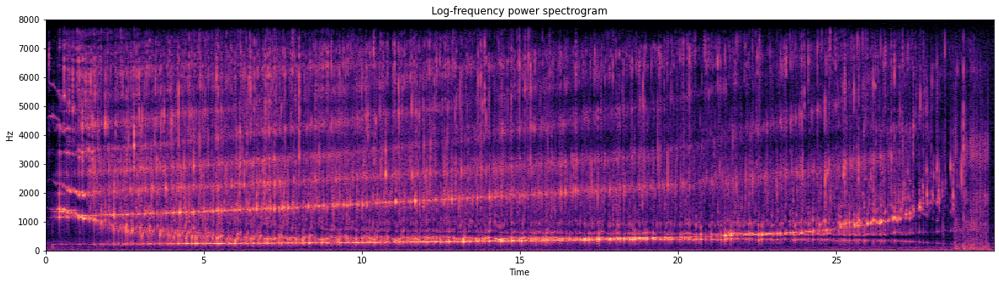

In [5]:
y, sr = librosa.load('/home/purnima/appdir/Github/DATA/WaterData_fullclips/audio/ZOOM0001.wav', sr=16000)
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(20,5))

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)),
                            ref=np.max)
librosa.display.specshow(D, y_axis='linear', sr=sr,
                        x_axis='time', ax=ax)
ax.set(title='Log-frequency power spectrogram')
ax.label_outer()

IPython.display.display(IPython.display.Audio(y, rate=sr))

# Real Data

In [6]:
water_data_dir = '/home/purnima/appdir/Github/DATA/WaterData_fullclips/water-data-split'
num_files = 50

realdata_file_dict = {}

for ind in range(1, num_files+1):
    ind_str = str(ind)
    if ind < 10:
        ind_str = ind_str.rjust(2,'0')
    filename = f'ZOOM00%s' % ind_str
    start_filename = f'%s_0.wav' % filename
    start_filename = os.path.join(water_data_dir, start_filename)
    
    if os.path.exists(start_filename):
        all_files = glob.glob(os.path.join(water_data_dir, filename+'*.wav'))
        all_files = sorted(all_files, key=lambda x:int(x.split(filename)[1].split('_')[1].split('.')[0]))
        end_filename = all_files[-3]
        middle_filename = all_files[len(all_files)//2]
        realdata_file_dict[ind] = {'start':start_filename, 'middle':middle_filename, 'end':end_filename}

        
for ind in realdata_file_dict.keys():
    start_wav, _ = librosa.load(realdata_file_dict[ind]['start'], sr=sample_rate)
    middle_wav, _ = librosa.load(realdata_file_dict[ind]['middle'], sr=sample_rate)
    end_wav, _ = librosa.load(realdata_file_dict[ind]['end'], sr=sample_rate)

    encoded_dict = {}

    for loc, audio in zip(['start_encoded', 'middle_encoded', 'end_encoded'],[start_wav, middle_wav, end_wav]):
        audio_pghi = preprocess_signal(audio)
        audio_pghi = zeropad(audio_pghi, n_frames * hop_size )
        audio_pghi = pghi_stft(audio_pghi)
        audio_pghi = renormalize(audio_pghi, (np.min(audio_pghi), np.max(audio_pghi)), (im_min, im_max))

        audio_pghi = torch.from_numpy(audio_pghi).float().cuda().unsqueeze(dim=0)
        mask = torch.ones_like(audio_pghi)[:, :1, :, :]*1
        net_input = torch.cat([audio_pghi, mask], dim=1).cuda()
        with torch.no_grad():
            encoded = netE(net_input)

        file_obj = realdata_file_dict[ind]
        file_obj[loc] = encoded
        realdata_file_dict[ind] = file_obj

# Gaver Data

In [7]:
#phi: Initial amplitude - relates to mallet hardness; force or proximity
#delta: Damping - relates to material (0=Full cosine no damping; higher values more damping;)
#omega: partial frequencies - relates to size, configuration (high pos/neg values are tinnier; values around zero are woody;)

def gaver_impact(phi, delta, omega, t, samplerate, add_variance=False):
    t_ = np.arange(t*samplerate)
    
    omega_ = omega
    if add_variance == True:
        omega_ = omega+np.random.uniform(-0.01,0.01)
    g = phi * np.exp(-1*delta*t_) * np.cos(omega_ * t_)
    
    return g
    

#each level is modelled as combination of 3 omegas of drips
def model_water_filling(num_secs, level=0, drip_secs=0.1):
    y = np.zeros(num_secs*sample_rate)
    
    if level==-1:
        start_drip = 0.55
        for i in range(int(num_secs/drip_secs)):
            omega_ = 0.45 + i*0.002
            drip_NN1 = gaver_impact(phi=(2-i*0.01), delta=0.003, omega=omega_, t=drip_secs, samplerate=16000, add_variance=True)
            omega__ = 0.45 - i*0.005
            drip_NN2 = gaver_impact(phi=(2-i*0.01), delta=0.003, omega=omega__, t=drip_secs, samplerate=16000, add_variance=True)
            
            drip = gaver_impact(phi=1, delta=0.003, omega=0.85, t=drip_secs, samplerate=16000, add_variance=True)
            drip_2 = gaver_impact(phi=0.5, delta=0.003, omega=0.1, t=drip_secs, samplerate=16000, add_variance=True)
            drip_3 = gaver_impact(phi=0.2, delta=0.003, omega=0.85, t=drip_secs, samplerate=16000, add_variance=True)
            
            y[int(i*drip_secs*sample_rate):int(i*drip_secs*sample_rate+(drip_secs*sample_rate))] = drip_NN1 +drip_NN2 +drip +drip_2
    
    if level==0:
        start_drip = 0.55
        for i in range(int(num_secs/drip_secs)):
            omega_ = 0.6 - i*0.005
            drip_NN1 = gaver_impact(phi=(2-i*0.01), delta=0.003, omega=omega_, t=drip_secs, samplerate=16000, add_variance=True)
            omega__ = 0.85 - i*0.005
            drip_NN2 = gaver_impact(phi=(2-i*0.01), delta=0.003, omega=omega__, t=drip_secs, samplerate=16000, add_variance=True)
            
            drip = gaver_impact(phi=0.2, delta=0.003, omega=0.1, t=drip_secs, samplerate=16000, add_variance=True)
            drip_2 = gaver_impact(phi=0.5, delta=0.003, omega=0.45, t=drip_secs, samplerate=16000, add_variance=True)
            drip_3 = gaver_impact(phi=0.2, delta=0.003, omega=0.85, t=drip_secs, samplerate=16000, add_variance=True)
            
            y[int(i*drip_secs*sample_rate):int(i*drip_secs*sample_rate+(drip_secs*sample_rate))] = drip + drip_2 + drip_3  + drip_NN1 + drip_NN2 #+g
            
    if level==1:
        for i in range(int(num_secs/drip_secs)):
            drip = gaver_impact(phi=1, delta=0.003, omega=0.1, t=drip_secs, samplerate=16000, add_variance=True)
            drip_2 = gaver_impact(phi=0.5, delta=0.003, omega=0.55, t=drip_secs, samplerate=16000, add_variance=True)
            drip_3 = gaver_impact(phi=0.2, delta=0.003, omega=0.85, t=drip_secs, samplerate=16000, add_variance=True)
            drip_4 = gaver_impact(phi=0.1, delta=0.003, omega=1.2, t=drip_secs, samplerate=16000, add_variance=True)
            y[int(i*drip_secs*sample_rate):int(i*drip_secs*sample_rate+(drip_secs*sample_rate))] = drip + drip_2 + drip_3 + drip_4
            
    
    if level==5:
        for i in range(int(num_secs/drip_secs)):
            drip = gaver_impact(phi=1, delta=0.003, omega=0.1, t=drip_secs, samplerate=16000, add_variance=True)
            drip_2 = gaver_impact(phi=1, delta=0.003, omega=0.15, t=drip_secs, samplerate=16000, add_variance=True)
            drip_3 = gaver_impact(phi=0.7, delta=0.003, omega=0.85, t=drip_secs, samplerate=16000, add_variance=True)
            y[int(i*drip_secs*sample_rate):int(i*drip_secs*sample_rate+(drip_secs*sample_rate))] = drip + drip_2 + drip_3 
            
    
    if level==11:
        for i in range(int(num_secs/(drip_secs))):
            
            omega_ = 0.55 + i*0.01
            drip_NN1 = gaver_impact(phi=1, delta=0.003, omega=omega_, t=drip_secs, samplerate=16000, add_variance=True)
            
            y[int(i*drip_secs*sample_rate):int(i*drip_secs*sample_rate+(drip_secs*sample_rate))] = drip_NN1

            
    return y

In [8]:
file_dict = {}

levels = [-1, 0, 5, 11]

for ind in range(10):
    for level in levels:
        audio = model_water_filling(num_secs=2, level=level, drip_secs=0.05)
        audio_pghi = preprocess_signal(audio)
        audio_pghi = zeropad(audio_pghi, n_frames * hop_size )
        audio_pghi = pghi_stft(audio_pghi)
        audio_pghi = renormalize(audio_pghi, (np.min(audio_pghi), np.max(audio_pghi)), (im_min, im_max))

        audio_pghi = torch.from_numpy(audio_pghi).float().cuda().unsqueeze(dim=0)
        mask = torch.ones_like(audio_pghi)[:, :1, :, :]*1
        net_input = torch.cat([audio_pghi, mask], dim=1).cuda()
        with torch.no_grad():
            encoded = netE(net_input)
            
        fileobj = {}
        fileobj['audio'] = audio
        fileobj['encoded'] = encoded
        file_dict[f'sampleid_%s_level_%s' % (ind, level)] = fileobj

In [9]:
file_dict.keys()

dict_keys(['sampleid_0_level_-1', 'sampleid_0_level_0', 'sampleid_0_level_5', 'sampleid_0_level_11', 'sampleid_1_level_-1', 'sampleid_1_level_0', 'sampleid_1_level_5', 'sampleid_1_level_11', 'sampleid_2_level_-1', 'sampleid_2_level_0', 'sampleid_2_level_5', 'sampleid_2_level_11', 'sampleid_3_level_-1', 'sampleid_3_level_0', 'sampleid_3_level_5', 'sampleid_3_level_11', 'sampleid_4_level_-1', 'sampleid_4_level_0', 'sampleid_4_level_5', 'sampleid_4_level_11', 'sampleid_5_level_-1', 'sampleid_5_level_0', 'sampleid_5_level_5', 'sampleid_5_level_11', 'sampleid_6_level_-1', 'sampleid_6_level_0', 'sampleid_6_level_5', 'sampleid_6_level_11', 'sampleid_7_level_-1', 'sampleid_7_level_0', 'sampleid_7_level_5', 'sampleid_7_level_11', 'sampleid_8_level_-1', 'sampleid_8_level_0', 'sampleid_8_level_5', 'sampleid_8_level_11', 'sampleid_9_level_-1', 'sampleid_9_level_0', 'sampleid_9_level_5', 'sampleid_9_level_11'])

# Test

None


Reconstructed


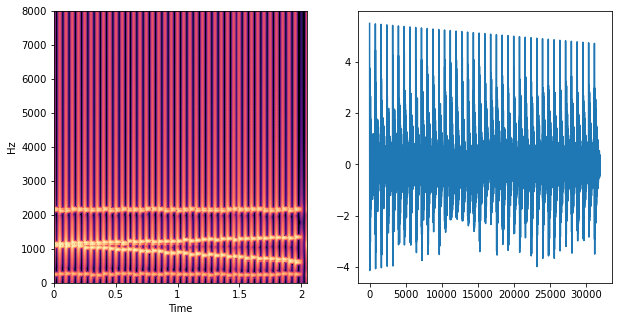

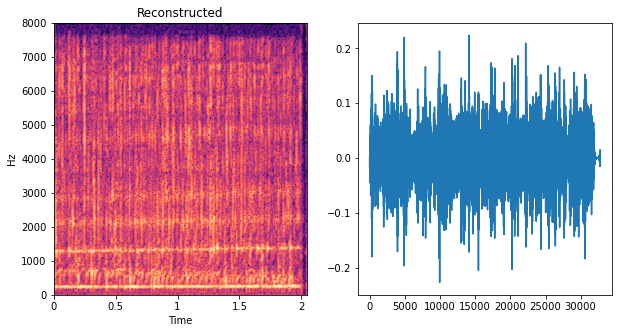

In [10]:
audio = file_dict['sampleid_1_level_-1']['audio']
encoded = file_dict['sampleid_1_level_-1']['encoded']
plot(audio)

reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

None


Reconstructed


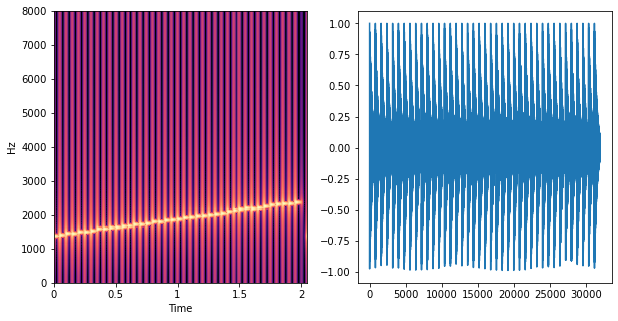

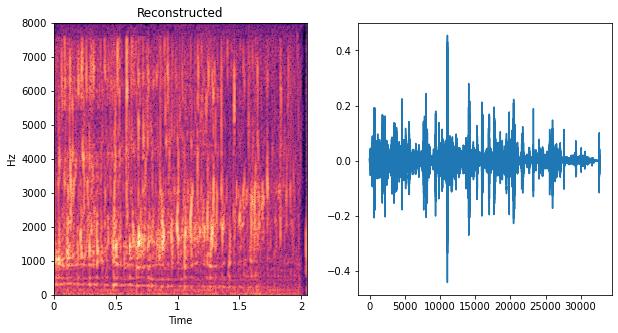

In [11]:
audio = file_dict['sampleid_1_level_11']['audio']
encoded = file_dict['sampleid_1_level_11']['encoded']
plot(audio)

reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

In [13]:
save_direction_vector = True

In [14]:
# start_ws = []
# end_ws = []
# for ind in range(10):
#     encoded_start = file_dict[f'sampleid_%s_level_%s' % (ind, 0)]['encoded']
#     encoded_end = file_dict[f'sampleid_%s_level_%s' % (ind, 11)]['encoded']
    
#     start_ws.append(encoded_start.cpu().numpy()[0])
#     end_ws.append(encoded_end.cpu().numpy()[0])
    
# start_ws = np.array(start_ws)
# end_ws = np.array(end_ws)

# start_ws_prototype = np.mean(start_ws, axis=0)
# end_ws_prototype = np.mean(end_ws, axis=0)

# direction = start_ws_prototype - end_ws_prototype
# direction = direction/np.linalg.norm(direction)
# direction = torch.from_numpy(direction)
# direction_vector = direction.cuda()

In [14]:
start_ws = []
end_ws = []
for ind in range(10):
    encoded_start = file_dict[f'sampleid_%s_level_%s' % (ind, 0)]['encoded']
    encoded_end = file_dict[f'sampleid_%s_level_%s' % (ind, 11)]['encoded']
    
    start_ws.append(encoded_start.cpu().numpy()[0])
    end_ws.append(encoded_end.cpu().numpy()[0])
    
w_avg = G.mapping.w_avg.cpu().numpy()

start_ws = np.array(start_ws)
end_ws = np.array(end_ws)

X_start_ws = (start_ws - w_avg).T
X_end_ws = (end_ws - w_avg).T


U_start_ws, S_start_ws, VT_start_ws = np.linalg.svd(X_start_ws, full_matrices=0)
U_end_ws, S_end_ws, VT_end_ws = np.linalg.svd(X_end_ws, full_matrices=0)

start_ws_prototype = np.mean(start_ws, axis=0) - w_avg
end_ws_prototype = np.mean(end_ws, axis=0) - w_avg
start_ws_prototype = (w_avg + (U_start_ws[:,:1] @ U_start_ws[:,:1].T @ start_ws_prototype.T)).T
end_ws_prototype = (w_avg + U_end_ws[:,:1] @ U_end_ws[:,:1].T @ end_ws_prototype.T).T

direction = start_ws_prototype - end_ws_prototype
if save_direction_vector:
    np.save('../interface/direction_vectors/water-filllevel.npy', direction)
direction = direction/np.linalg.norm(direction)
direction = torch.from_numpy(direction)
direction_vector = direction.cuda()

1. Reconstructed


2. Reconstructed


3. Reconstructed


4. Reconstructed


5. Reconstructed


6. Reconstructed


7. Reconstructed


8. Reconstructed


9. Reconstructed


10. Reconstructed


11. Reconstructed


12. Reconstructed


13. Reconstructed


14. Reconstructed


15. Reconstructed


16. Reconstructed


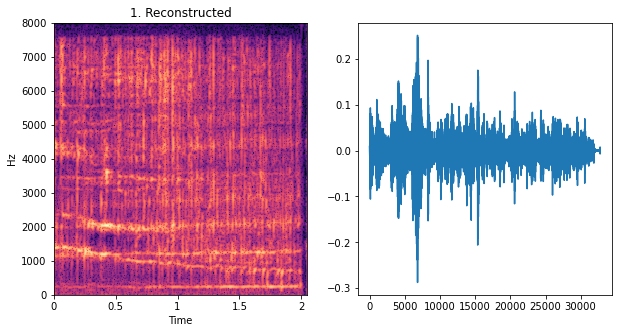

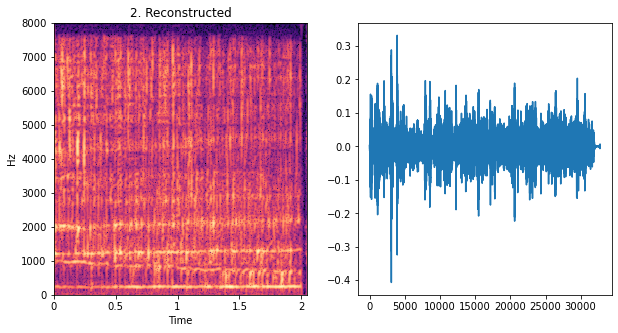

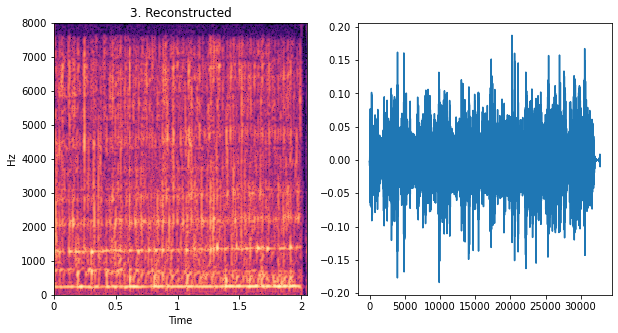

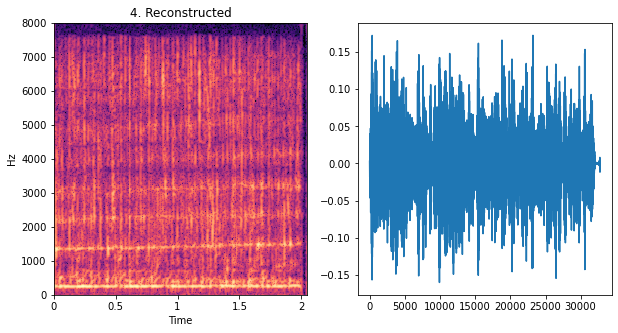

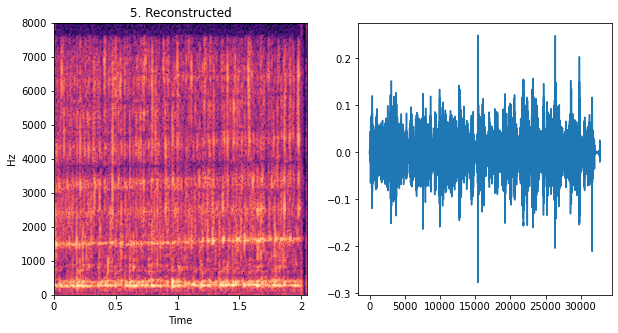

...

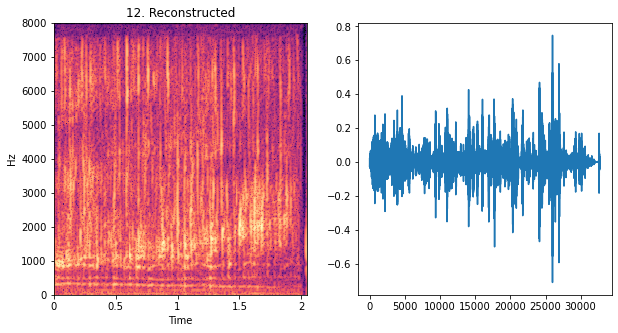

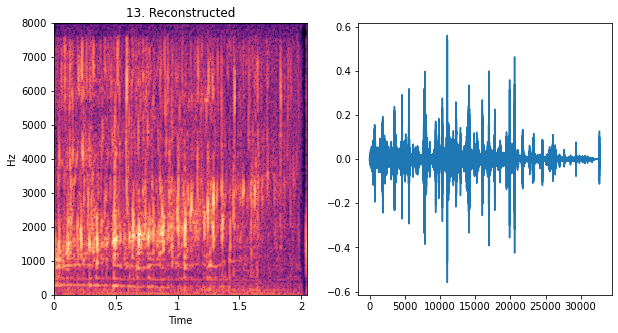

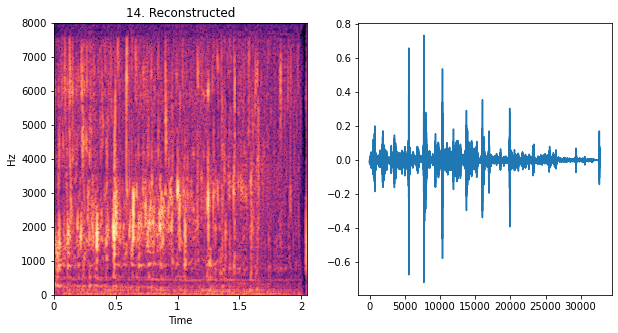

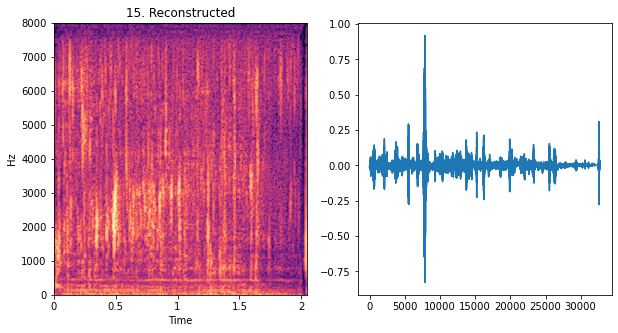

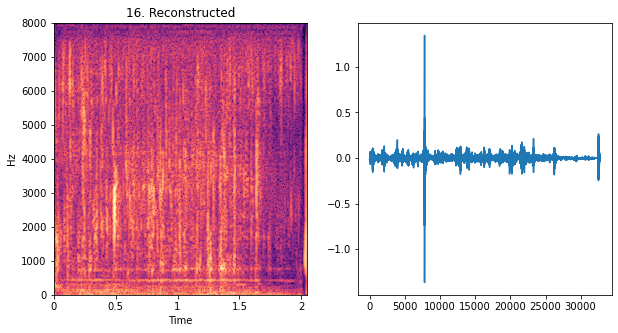

In [15]:
sample_encoded = realdata_file_dict[48]['start_encoded'].float().cuda() 
direction_vector = direction_vector.cuda()
for i in np.arange(0, 16, 1): 
    # Recon and plot
    encoded = sample_encoded - direction_vector * i
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i+1))

1. Reconstructed


2. Reconstructed


3. Reconstructed


4. Reconstructed


5. Reconstructed


6. Reconstructed


7. Reconstructed


8. Reconstructed


9. Reconstructed


10. Reconstructed


11. Reconstructed


12. Reconstructed


13. Reconstructed


14. Reconstructed


15. Reconstructed


16. Reconstructed


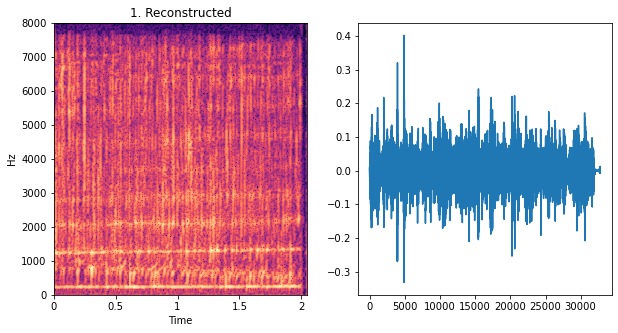

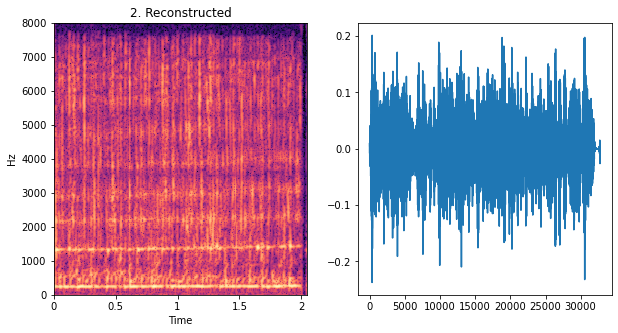

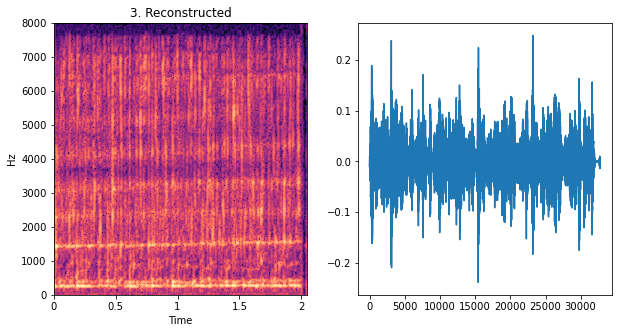

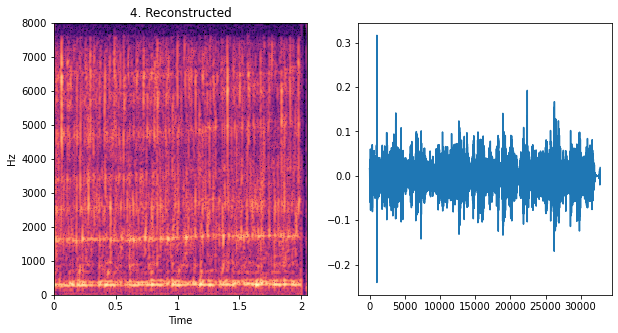

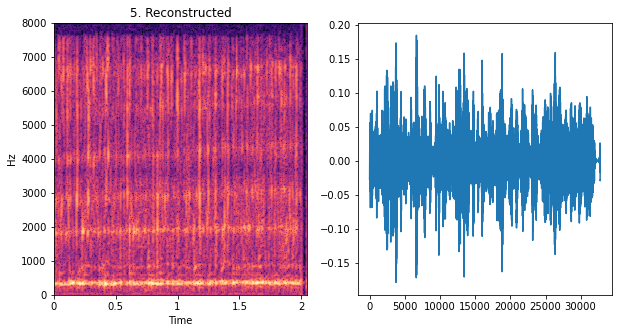

...

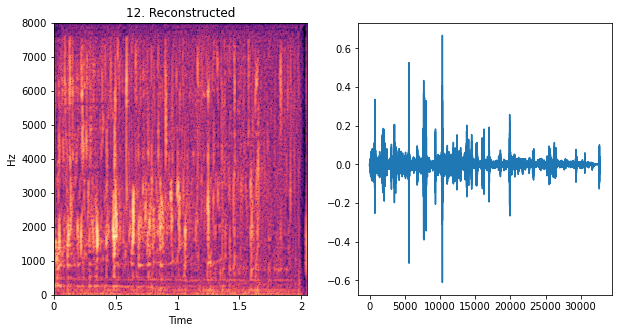

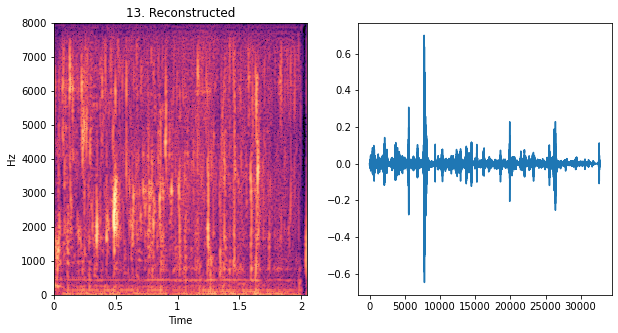

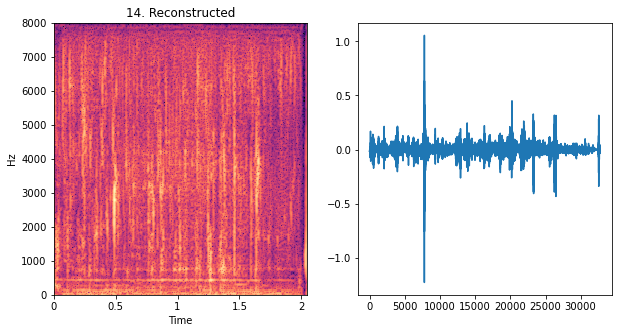

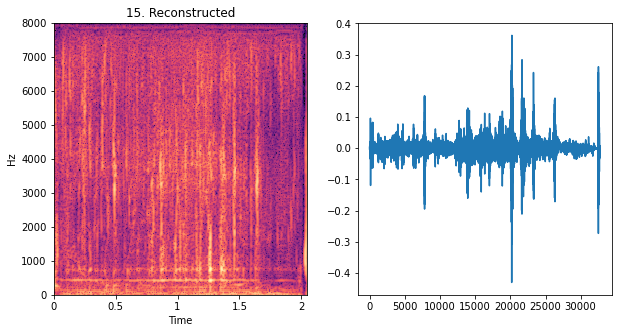

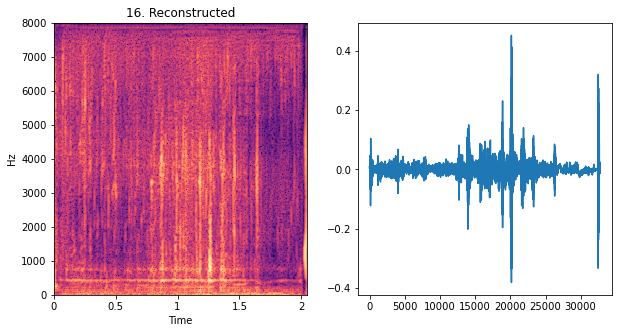

In [14]:
sample_encoded = file_dict['sampleid_4_level_0']['encoded'].float().cuda() 
direction_vector = direction_vector.cuda()
for i in np.arange(0, 16, 1): 
    # Recon and plot
    encoded = sample_encoded - direction_vector * i
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i+1))